## import the necessary libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
from pathlib import Path
from tensorflow import keras
import pickle 
from PIL import Image
config_jedi=False

## define various function

In [2]:
# function which shows the random images in dataset batch along with their labels 
def random_images(dataset,class_name):
    plt.figure(figsize=(16,12))
    for image_batch,label_batch in dataset.take(1):
        if len(image_batch)!=32:
            random_images(dataset,class_names)
        else:
            for i in range(12):
                plt.subplot(3,4,i+1)
                random = np.random.randint(0,32)
                plt.imshow(image_batch[random].numpy().astype('uint8'))
                plt.title(f'{class_name[label_batch[i]]}')
                plt.axis('off')

In [3]:
# split the dataset into training, testing and validation batches 
def train_test_split(dataset, shuffle = True, train_size = 0.7, val_size = 0.15, test_size = 0.15, shuffle_size = 10000):
    len_data = len(dataset)

    # shuffle the dataset before splitting
    if shuffle:
        dataset.shuffle(shuffle_size)

    train_size = int(train_size*len_data)
    val_size = int(val_size*len_data)

    train_ds = dataset.take(train_size)
    val_ds = dataset.skip(train_size).take(val_size)
    test_ds = dataset.skip(train_size).skip(val_size)

    return train_ds,test_ds,val_ds

In [4]:
# function which shows the augmented images
def augmented_img(dataset, class_name):
    plt.figure(figsize = (12,12))
    for image_batch,label_batch in dataset.take(1):
        if len(image_batch) != 32:
            random_images(dataset,class_names)
        else:
            for i in range(9):
                plt.subplot(3,3,i+1)
                aug_img = data_augmentation(image_batch)
                plt.imshow(aug_img[0].numpy().astype('uint8'))
                plt.axis('off')

In [5]:
# define the pretreined custom model along with fine tuning 
def pretrained_custom_model(base_model, data_augmentation, preprocess_input, freeze_layers_upto, base_learning_rate = 0.0001):
        # params:
        # base_model : pre-trained model
        # freeze_layers_upto : (int) layer upto which pre-trained model weights not changed
    
        # Freeze the layers of the pre-trained model
        for layer in base_model.layers[:freeze_layers_upto]:
            layer.trainable = False
        
        # adding custom layers for specific task
        inputs = tf.keras.Input(shape=(160, 160, 3))
        x = data_augmentation(inputs)
        x = preprocess_input(x)
        x = base_model(x, training=False)
        x = tf.keras.layers.GlobalAveragePooling2D()(x)
        x = tf.keras.layers.Flatten()(x)
        x = tf.keras.layers.Dense(512, activation = "relu", kernel_regularizer = keras.regularizers.l2(l2 = 0.005))(x)
        x = tf.keras.layers.Dropout(0.5)(x)
        x = tf.keras.layers.Dense(256, activation = "relu", kernel_regularizer = keras.regularizers.l2(l2 = 0.005))(x)
        x = tf.keras.layers.Dropout(0.2)(x)
        outputs = tf.keras.layers.Dense(10, activation = 'softmax')(x)

        # build the model 
        model = tf.keras.Model(inputs, outputs)

        # define the optimizer, loss, and metrics for model compilation
        model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = base_learning_rate),
                      loss = 'SparseCategoricalCrossentropy',
                      metrics = ['accuracy'])
        
        return model

In [6]:
# train the model and return model history along with trained model params 
def train_model(model, train_ds, valid_ds, model_name, epochs = 10):
    # params::
    # model      : trained model
    # train_ds   : training dataset (contain images and labels)
    # val_ds     : validation dataset (contain images and labels)
    # model_name : directory name (str) 

    #save the current directory path
    current_dir = Path.cwd()

    #create directory for storing callback model
    save_model_dir = Path.cwd() / 'saved_model' / f'{model_name}' / 'callbacks' 
    save_model_dir.mkdir(parents = True, exist_ok = True)

    #change to the callback directory
    os.chdir(save_model_dir)
    checkpoint = keras.callbacks.ModelCheckpoint(f'{model_name}.h5', save_best_only = True, monitor = 'val_loss', mode = 'min', verbose = 1)

    # store the model history 
    history = model.fit(
        train_ds,
        validation_data = valid_ds,
        epochs = epochs,
        callbacks = [checkpoint],
        verbose = 1,
    )

    #finally goes back to current directory
    os.chdir(current_dir)
    return history

In [7]:
# plot the traing-validation loss, traing-validation accuracy
def plot_history(history):
    # params:: history: model history stored after fitting (training)
    
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    plt.figure(figsize = (8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(acc, label = 'Training Accuracy')
    plt.plot(val_acc, label = 'Validation Accuracy')
    plt.legend(loc = 'lower right')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    
    plt.subplot(2, 1, 2)
    plt.plot(loss, label = 'Training Loss')
    plt.plot(val_loss, label = 'Validation Loss')
    plt.legend(loc = 'upper right')
    plt.ylabel('SparseCategorical Cross Entropy')
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')
    plt.show()

In [8]:
def display_test_ds_with_predictions(class_name, test_ds, model):
    # params:
    # class_name : list which containes classes / labels
    # test_ds    : test dataset
    # model      : trained model

    #loss and accuarcy
    loss, accuracy = model.evaluate(test_ds)
    print(f"loss = {loss:.4f},\naccuracy = {accuracy:.5f}")
    
    # Retrieve a batch of images from the test set
    image_batch, label_batch = test_ds.as_numpy_iterator().next()

    # predictions gives us the probability of images belonging to each class 
    predictions = model.predict_on_batch(image_batch)

    # assign class which has max probability
    predictions_index = np.argmax(predictions, axis = 1)
    
    plt.figure(figsize=(16, 16))
    if len(image_batch)!=32:
            display_test_ds_with_predictions(class_name, test_ds, model)
    else:
        for i in range(9):
          plt.subplot(3, 3, i + 1)
          random = np.random.randint(0,32)
          plt.imshow(image_batch[random].astype("uint8"))
          plt.title(f"Actual label = {class_name[label_batch[i]]},\npredicted label = {class_name[(predictions_index[i])]},\nconfidence level = {np.round(np.max(predictions[i])*100,2)}%")
          plt.axis("off")

In [9]:
# store the model history and model as well 
def store_history_model(model_name, history, model):
    # params:: 
    # history    : model history stored after fitting (training)
    # model      : trained model
    # model_name : directory name (str) 
    
    # create new directory for storing model as well as history
    model_dir = Path.cwd() / 'saved_model' / f'{model_name}'
    model_dir.mkdir(parents = True, exist_ok = True)

    # store the history
    hist_path = model_dir / 'history'
    pickle.dump(history, open(f'{hist_path}', 'wb'))

    # store the model
    model_path = model_dir / f'{model_name}.h5'
    model.save(model_path)

In [10]:
# load the saved model into memory
def open_saved_model(model_name):
    # params:: model_name : directory name (str) 
    
    hist_path = Path.cwd() / 'saved_model' / f'{model_name}' / 'history'
    history = pickle.load(open(f'{hist_path}', 'rb'))
    model_path = Path.cwd() / 'saved_model' / f'{model_name}' / f'{model_name}.h5'
    model = keras.models.load_model(model_path)
    return history, model

In [11]:
# fuction which define the order in which function is called from training the model till saving the model
def pipeline(base_model, data_augmentation, preprocess_input, freeze_layers_upto, model_name, train_ds, val_ds, test_ds, class_name, epochs = 10,  base_learning_rate = 0.0001):
    model = pretrained_custom_model(base_model, data_augmentation, preprocess_input ,freeze_layers_upto , base_learning_rate)
    history = train_model(model, train_ds, val_ds, f'{model_name}', epochs)
    plot_history(history)
    display_test_ds_with_predictions(class_name, test_ds, model)
    store_history_model(f'{model_name}', history, model)

In [12]:
# fuction which provide the layer from which weights are updated of pre-trained model during training
def fine_tune_at(base_model, fine_tune_from):
    # params::
    # base_model : pre-trained model
    # fine_tune_from : (int) (0 < fine_tune_from < len(base_model.layers))
    
    print("Number of layers in the base model: ", len(base_model.layers))
    
    # Fine-tune from this layer onwards
    fine_tune_at = len(base_model.layers) - fine_tune_from
    return fine_tune_at

In [13]:
# predict the class of images which are taken from internet for testing purpose 
def display_images(model, class_name, URL):
    # params::
    # URL : (str) website link 
    # model : model used for prediction 
    # class_name : list which containes classes / labels
    
    #create directory for test images
    path = Path.cwd() / 'Test Images'
    path.mkdir(parents = True, exist_ok = True)

    #download the image from internet using URL
    file_name = tf.keras.utils.get_file(origin = URL, cache_subdir = path, extract = True)

    #resize teh image, expand dimesion for predictions (3D but require 4D array)
    resize_img4_array=np.array(Image.open(file_name).resize((160,160)))
    img4_array_batch=np.expand_dims(resize_img4_array,0)

    #prediction, class define, probability
    prediction=model.predict(img4_array_batch)
    class_ = class_name[np.argmax(prediction[0])]
    confidence = np.round(np.max(prediction[0])*100,2)

    #visuallize image
    plt.imshow(resize_img4_array)
    plt.title(f"class : {class_},\nconfidence : {confidence}%")
    plt.axis('off')

## load the dataset and define class name

In [14]:
# directory which contain data
data_dir = Path.cwd() / 'data'

# define the image size, batch size and channels
img_size = 160
batch_size = 32
channels = 3

# load data from hard disk to memory
dataset = tf.keras.preprocessing.image_dataset_from_directory(data_dir,
                                                            image_size = (img_size,img_size),
                                                            batch_size = batch_size,
                                                            shuffle = True)

# define the labels (classes)
class_names = dataset.class_names
class_name = [i.split('Tomato_')[-1] for i in class_names]

Found 16011 files belonging to 10 classes.


In [15]:
model_dir = Path.cwd() / 'saved_model'
model_dir.mkdir(parents = True, exist_ok = True)
file_name = model_dir / 'class_name.npy' 
np.save(file_name,class_name)

## display the random images from datasets

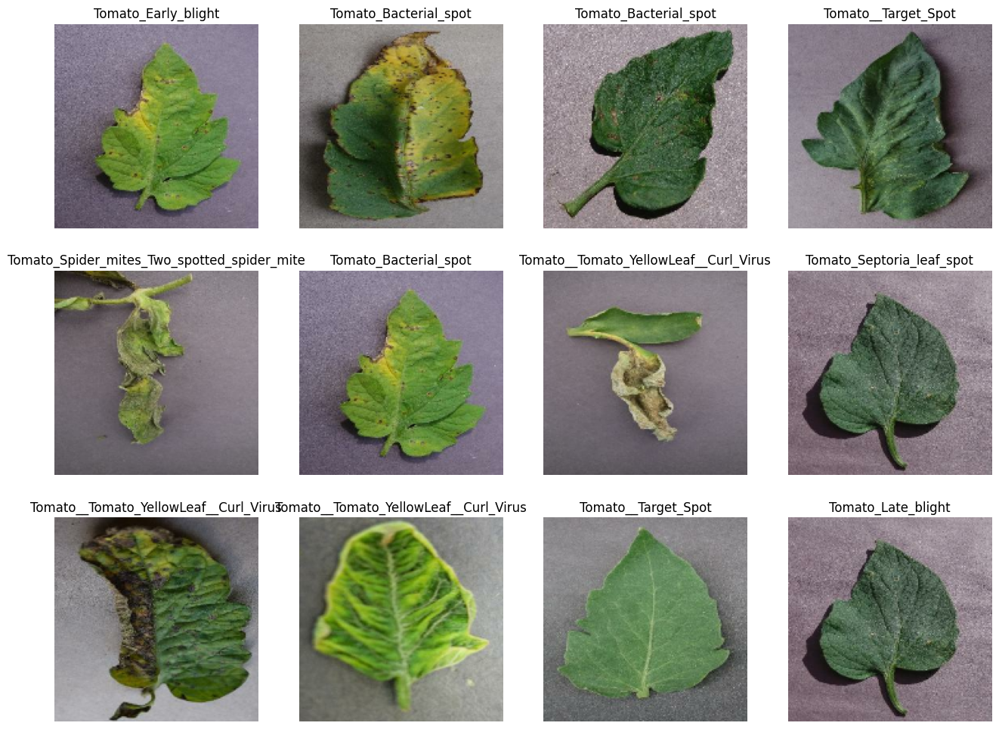

In [16]:
random_images(dataset,class_names)

## split the dataset into train-test-validation

In [17]:
train_ds, test_ds, val_ds = train_test_split(dataset)

In [18]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)

## define the resize and data augmentation layer 

In [19]:
# resize and rescale layer
resize_and_rescale=keras.Sequential([
    keras.layers.experimental.preprocessing.Resizing(img_size,img_size),
    keras.layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [20]:
# data augmentation layer
data_augmentation=keras.Sequential([
    keras.layers.RandomFlip('horizontal_and_vertical'),
    keras.layers.RandomRotation(0.3),
    keras.layers.RandomZoom(0.2),
    keras.layers.RandomContrast(0.5)
])

## visualize the augmented images

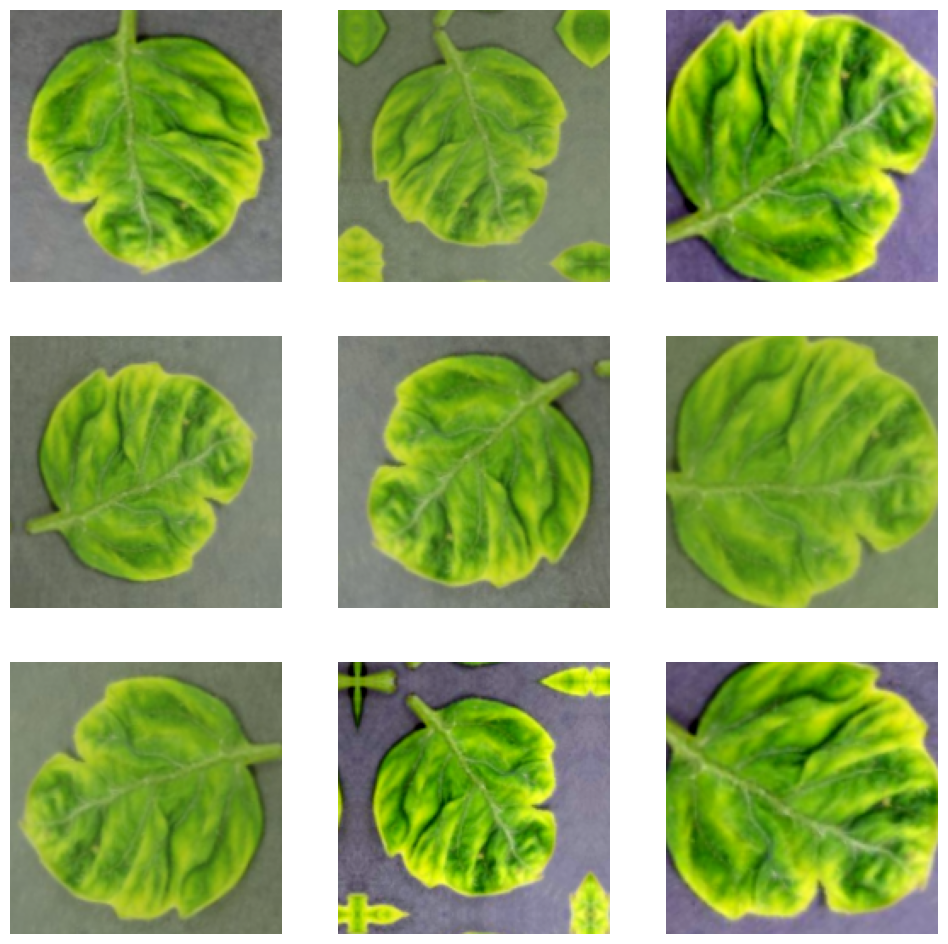

In [21]:
augmented_img(dataset, class_name)

## custom model (build, train, plot history, save model)

In [22]:
# define the input shape and number of classes
input_shape = (batch_size,img_size,img_size,channels)
n_classes = len(class_names)

# define the model layer
model = keras.Sequential([
    resize_and_rescale,
    data_augmentation,
    keras.layers.Conv2D(32,(3,3),activation = 'relu',input_shape = input_shape),
    keras.layers.MaxPooling2D((2,2)),
    keras.layers.Conv2D(64,(3,3),activation = 'relu'),
    keras.layers.MaxPooling2D((2,2)),
    keras.layers.Conv2D(64,(3,3),activation = 'relu'),
    keras.layers.MaxPooling2D((2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(64,activation = 'relu'),
    keras.layers.Dense(n_classes,activation = 'softmax')
])

# build the model
model.build(input_shape = input_shape)

# define the optimizer, loss, and metrics for model compilation
model.compile(
    optimizer = 'adam',
    loss = 'SparseCategoricalCrossentropy',
    metrics = ['accuracy']
)

# gives the glimpse about type of model layer, it's shape, and parameter present in it
model.summary()



Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 160, 160, 3)         0         
                                                                 
 sequential_1 (Sequential)   (32, 160, 160, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 158, 158, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (32, 79, 79, 32)          0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (32, 77, 77, 64)          18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (32, 38, 38, 64)          0         
 g2D)                                               

In [23]:
history = train_model(model, train_ds, val_ds, 'custom_model', 10)

Epoch 1/10


350/350 [==============================] - ETA: 0s - loss: 1.5875 - accuracy: 0.4487
Epoch 1: val_loss improved from inf to 1.69775, saving model to custom_model.h5


C:\Users\Krushna\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


350/350 [==============================] - 260s 731ms/step - loss: 1.5875 - accuracy: 0.4487 - val_loss: 1.6978 - val_accuracy: 0.4746
Epoch 2/10
350/350 [==============================] - ETA: 0s - loss: 0.9911 - accuracy: 0.6641
Epoch 2: val_loss improved from 1.69775 to 1.43270, saving model to custom_model.h5
350/350 [==============================] - 260s 744ms/step - loss: 0.9911 - accuracy: 0.6641 - val_loss: 1.4327 - val_accuracy: 0.5725
Epoch 3/10
350/350 [==============================] - ETA: 0s - loss: 0.8151 - accuracy: 0.7229
Epoch 3: val_loss did not improve from 1.43270
350/350 [==============================] - 267s 762ms/step - loss: 0.8151 - accuracy: 0.7229 - val_loss: 1.6237 - val_accuracy: 0.5846
Epoch 4/10
350/350 [==============================] - ETA: 0s - loss: 0.6998 - accuracy: 0.7628
Epoch 4: val_loss improved from 1.43270 to 1.42319, saving model to custom_model.h5
350/350 [==============================] - 252s 720ms/step - loss: 0.6998 - accuracy: 0.7628

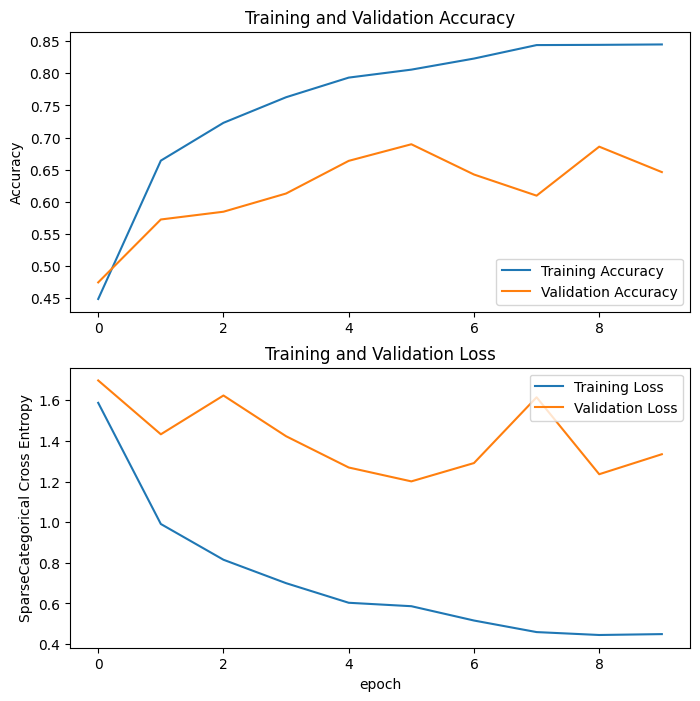

In [24]:
plot_history(history)

76/76 [==============================] - 25s 188ms/step - loss: 1.3606 - accuracy: 0.6392
loss = 1.3606,
accuracy = 0.63915


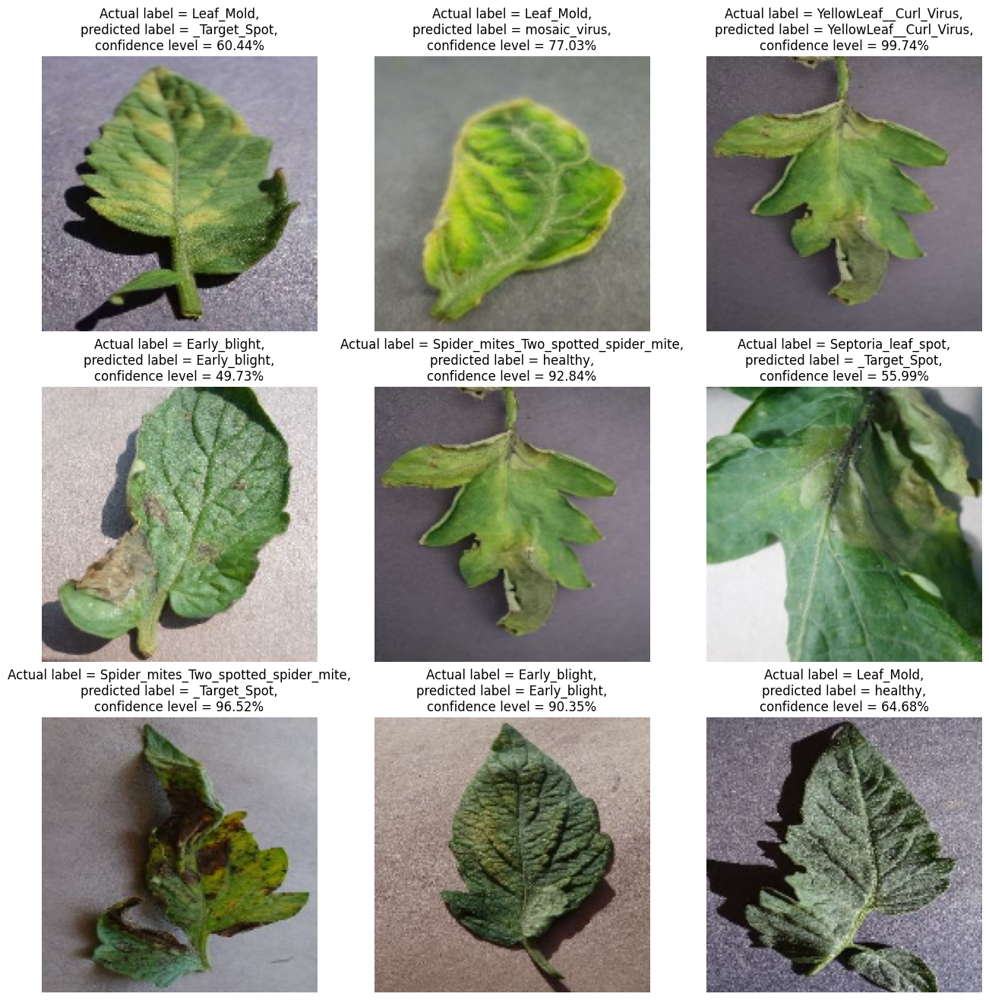

In [25]:
display_test_ds_with_predictions(class_name, test_ds, model)

In [26]:
store_history_model('custom_model', history, model)

In [27]:
history1, model1 = open_saved_model('custom_model')

1/1 [==============================] - 0s 475ms/step


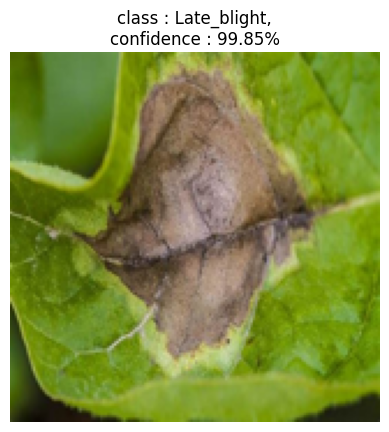

In [28]:
URL = 'https://th.bing.com/th/id/OIP.e68jyHBqwvCUog-UHbfMFAHaE8?w=1068&h=712&rs=1&pid=ImgDetMain'
file_name = Path.cwd() / 'saved_model' / 'class_name.npy'
class_name1 = np.load(file_name)
display_images(model1, class_name1, URL)

## pretrained-model with fine-tuning (mobilenetv2)

In [29]:
IMG_SHAPE=(img_size,img_size,channels)
base_model = tf.keras.applications.mobilenet_v2.MobileNetV2(
                                input_shape=IMG_SHAPE,
                                include_top=False,
                                weights='imagenet'
                            )

In [30]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [31]:
freezes_layers_upto = fine_tune_at(base_model, 50)
model_name = 'mobilenet_v2'

Number of layers in the base model:  154


Epoch 1/10
350/350 [==============================] - ETA: 0s - loss: 5.4385 - accuracy: 0.5942
Epoch 1: val_loss improved from inf to 4.09347, saving model to mobilenet_v2.h5
350/350 [==============================] - 280s 757ms/step - loss: 5.4385 - accuracy: 0.5942 - val_loss: 4.0935 - val_accuracy: 0.7721
Epoch 2/10
350/350 [==============================] - ETA: 0s - loss: 3.4877 - accuracy: 0.8170
Epoch 2: val_loss improved from 4.09347 to 3.16056, saving model to mobilenet_v2.h5
350/350 [==============================] - 215s 613ms/step - loss: 3.4877 - accuracy: 0.8170 - val_loss: 3.1606 - val_accuracy: 0.7967
Epoch 3/10
350/350 [==============================] - ETA: 0s - loss: 2.6395 - accuracy: 0.8691
Epoch 3: val_loss improved from 3.16056 to 2.38043, saving model to mobilenet_v2.h5
350/350 [==============================] - 216s 618ms/step - loss: 2.6395 - accuracy: 0.8691 - val_loss: 2.3804 - val_accuracy: 0.8717
Epoch 4/10
350/350 [==============================] - ETA: 

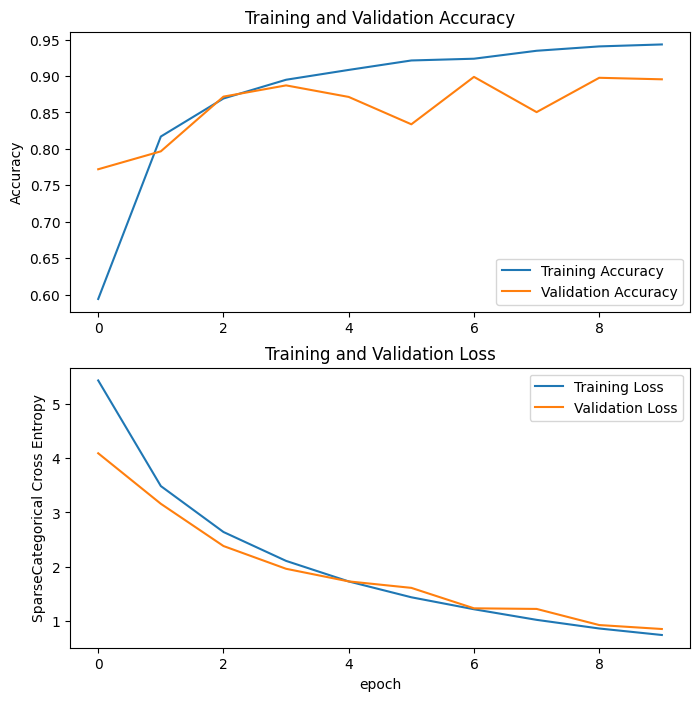

76/76 [==============================] - 38s 329ms/step - loss: 0.8242 - accuracy: 0.8946
loss = 0.8242,
accuracy = 0.89465


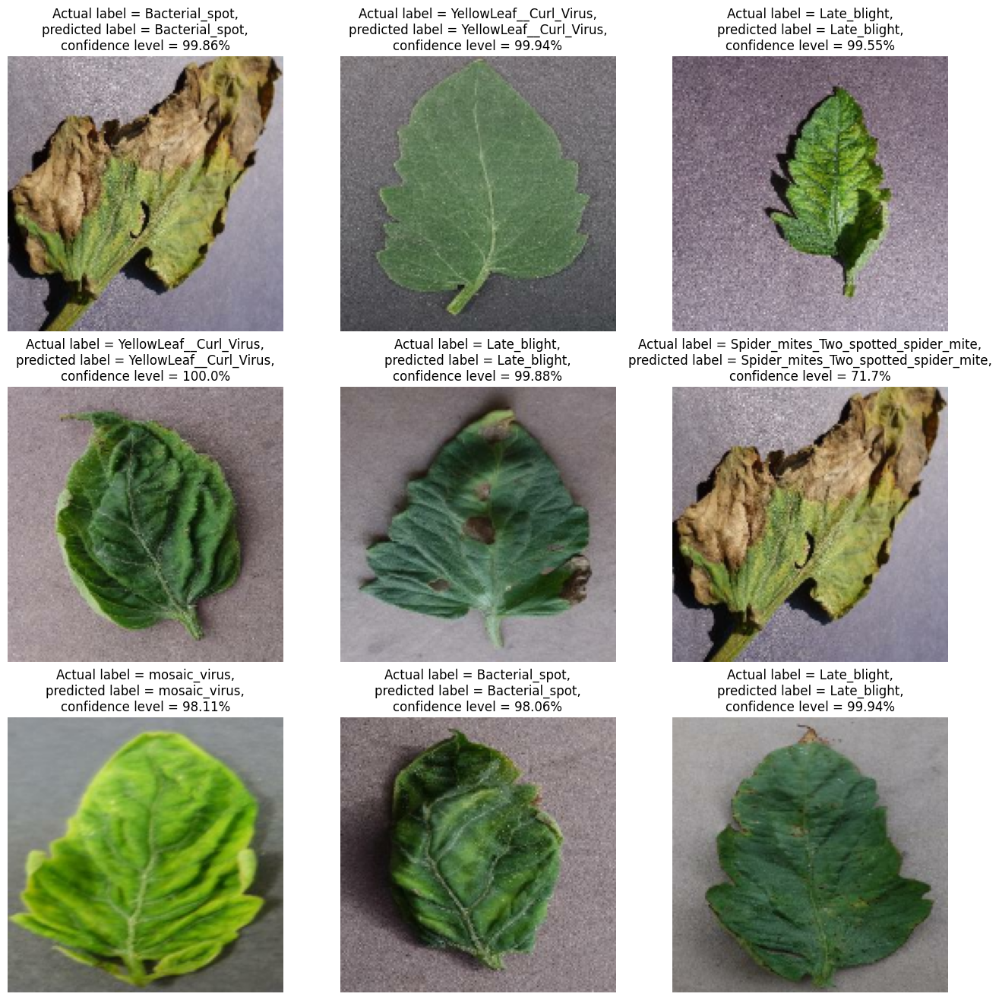

In [32]:
pipeline(base_model, data_augmentation, preprocess_input, freezes_layers_upto, model_name, train_ds, val_ds, test_ds, class_name,)

In [33]:
history2, model2 = open_saved_model('mobilenet_v2')

1/1 [==============================] - 1s 1s/step


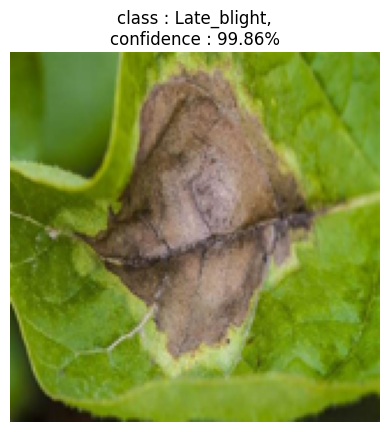

In [34]:
URL = 'https://th.bing.com/th/id/OIP.e68jyHBqwvCUog-UHbfMFAHaE8?w=1068&h=712&rs=1&pid=ImgDetMain'
file_name = Path.cwd() / 'saved_model' / 'class_name.npy'
class_name1 = np.load(file_name)
display_images(model2, class_name1, URL)

## pretrained-model with fine-tuning (inceptionv3)

In [35]:
base_model1 = tf.keras.applications.inception_v3.InceptionV3(
                    include_top=False,
                    weights='imagenet',
                    input_shape=IMG_SHAPE
                )

In [36]:
preprocess_input1 = tf.keras.applications.inception_v3.preprocess_input

In [37]:
freezes_layers_upto1 = fine_tune_at(base_model1, 100)
model_name1 = 'inception_v3'

Number of layers in the base model:  311


Epoch 1/10
350/350 [==============================] - ETA: 0s - loss: 5.7991 - accuracy: 0.6367
Epoch 1: val_loss improved from inf to 4.49913, saving model to inception_v3.h5
350/350 [==============================] - 453s 1s/step - loss: 5.7991 - accuracy: 0.6367 - val_loss: 4.4991 - val_accuracy: 0.7804
Epoch 2/10
350/350 [==============================] - ETA: 0s - loss: 3.6786 - accuracy: 0.8438
Epoch 2: val_loss improved from 4.49913 to 3.06260, saving model to inception_v3.h5
350/350 [==============================] - 439s 1s/step - loss: 3.6786 - accuracy: 0.8438 - val_loss: 3.0626 - val_accuracy: 0.8758
Epoch 3/10
350/350 [==============================] - ETA: 0s - loss: 2.6619 - accuracy: 0.8849
Epoch 3: val_loss improved from 3.06260 to 2.33214, saving model to inception_v3.h5
350/350 [==============================] - 383s 1s/step - loss: 2.6619 - accuracy: 0.8849 - val_loss: 2.3321 - val_accuracy: 0.8992
Epoch 4/10
350/350 [==============================] - ETA: 0s - loss

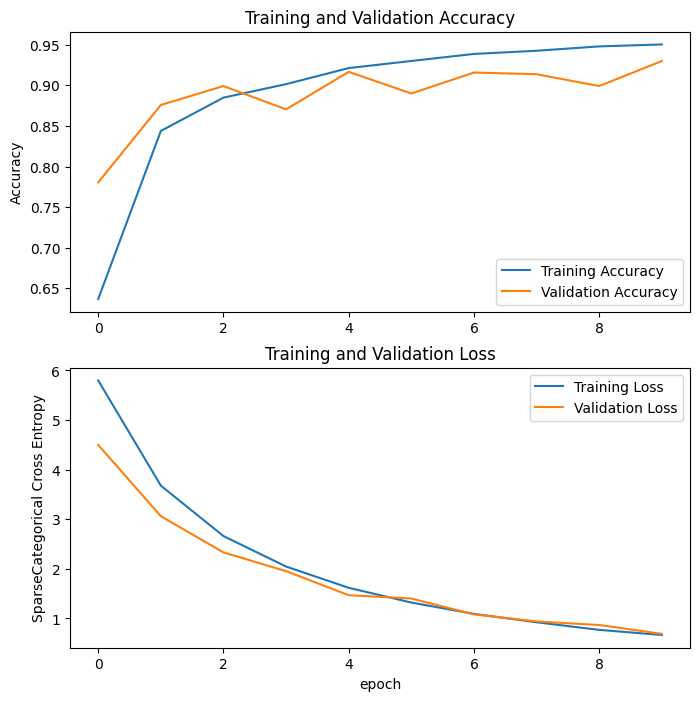

76/76 [==============================] - 52s 572ms/step - loss: 0.6783 - accuracy: 0.9282
loss = 0.6783,
accuracy = 0.92825


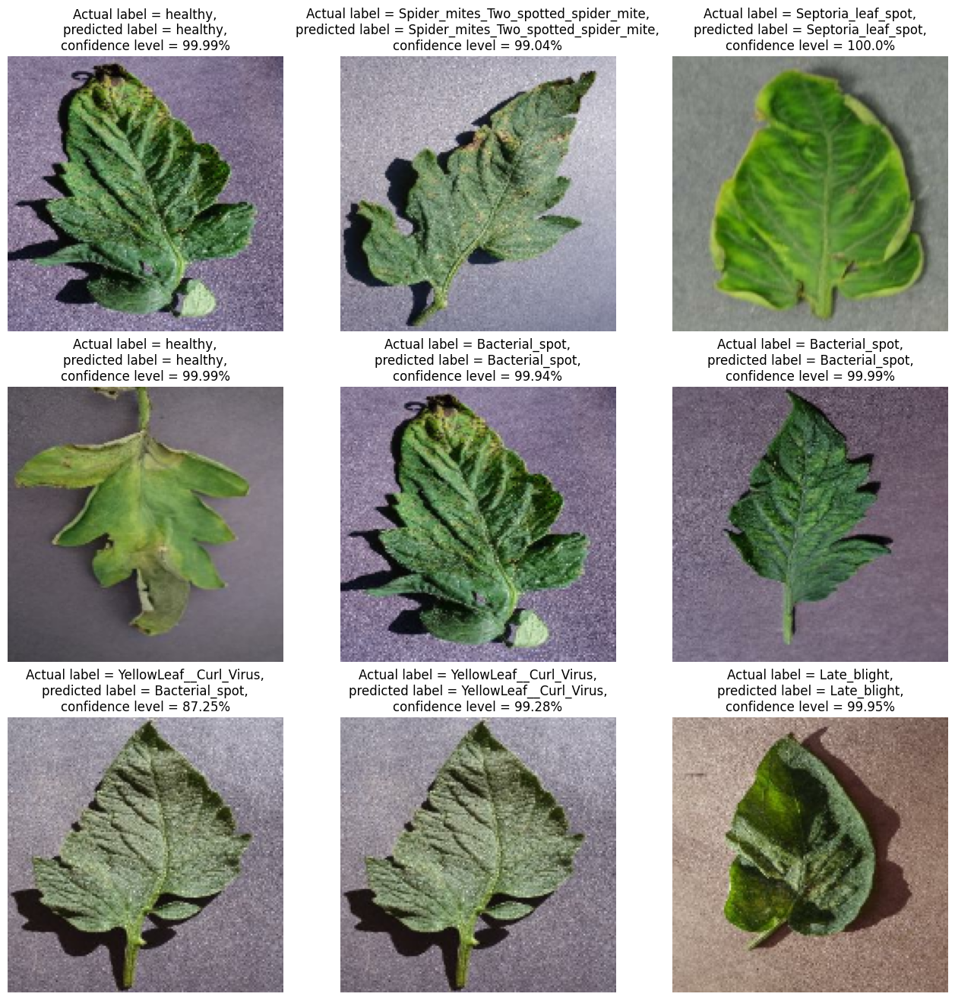

In [38]:
pipeline(base_model1, data_augmentation, preprocess_input1, freezes_layers_upto1, model_name1, train_ds, val_ds, test_ds, class_name,)

In [39]:
history3, model3 = open_saved_model('inception_v3')

1/1 [==============================] - 2s 2s/step


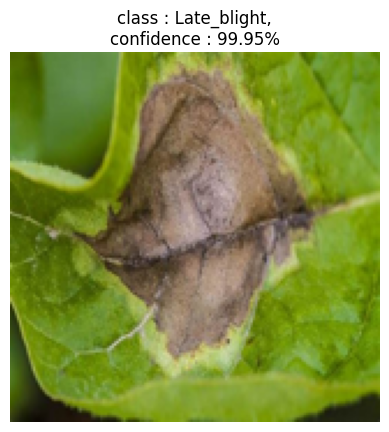

In [40]:
URL = 'https://th.bing.com/th/id/OIP.e68jyHBqwvCUog-UHbfMFAHaE8?w=1068&h=712&rs=1&pid=ImgDetMain'
file_name = Path.cwd() / 'saved_model' / 'class_name.npy'
class_name1 = np.load(file_name)
display_images(model3, class_name1, URL)

## pretrained-model with fine-tuning (xception)

In [41]:
base_model2 = tf.keras.applications.xception.Xception(
                    include_top=False,
                    weights='imagenet',
                    input_shape=IMG_SHAPE
)

In [42]:
preprocess_input2 = tf.keras.applications.xception.preprocess_input

In [43]:
freezes_layers_upto2 = fine_tune_at(base_model2, 100)
model_name2 = 'xception'

Number of layers in the base model:  132


Epoch 1/10
350/350 [==============================] - ETA: 0s - loss: 5.0443 - accuracy: 0.7204
Epoch 1: val_loss improved from inf to 3.82033, saving model to xception.h5
350/350 [==============================] - 2191s 6s/step - loss: 5.0443 - accuracy: 0.7204 - val_loss: 3.8203 - val_accuracy: 0.8154
Epoch 2/10
350/350 [==============================] - ETA: 0s - loss: 2.8437 - accuracy: 0.9212
Epoch 2: val_loss improved from 3.82033 to 2.65285, saving model to xception.h5
350/350 [==============================] - 2178s 6s/step - loss: 2.8437 - accuracy: 0.9212 - val_loss: 2.6528 - val_accuracy: 0.8617
Epoch 3/10
350/350 [==============================] - ETA: 0s - loss: 2.0182 - accuracy: 0.9465
Epoch 3: val_loss improved from 2.65285 to 1.76880, saving model to xception.h5
350/350 [==============================] - 1712s 5s/step - loss: 2.0182 - accuracy: 0.9465 - val_loss: 1.7688 - val_accuracy: 0.9475
Epoch 4/10
350/350 [==============================] - ETA: 0s - loss: 1.5180 

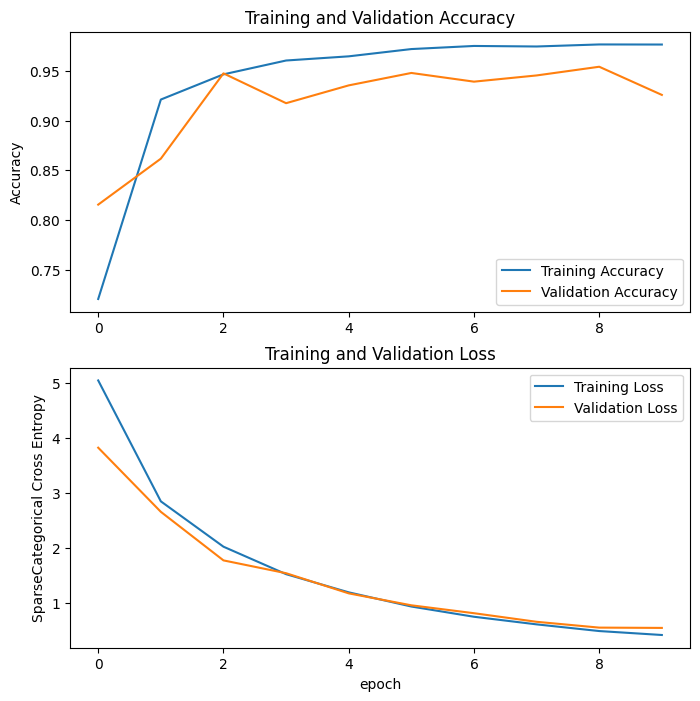

76/76 [==============================] - 89s 1s/step - loss: 0.5262 - accuracy: 0.9370
loss = 0.5262,
accuracy = 0.93696


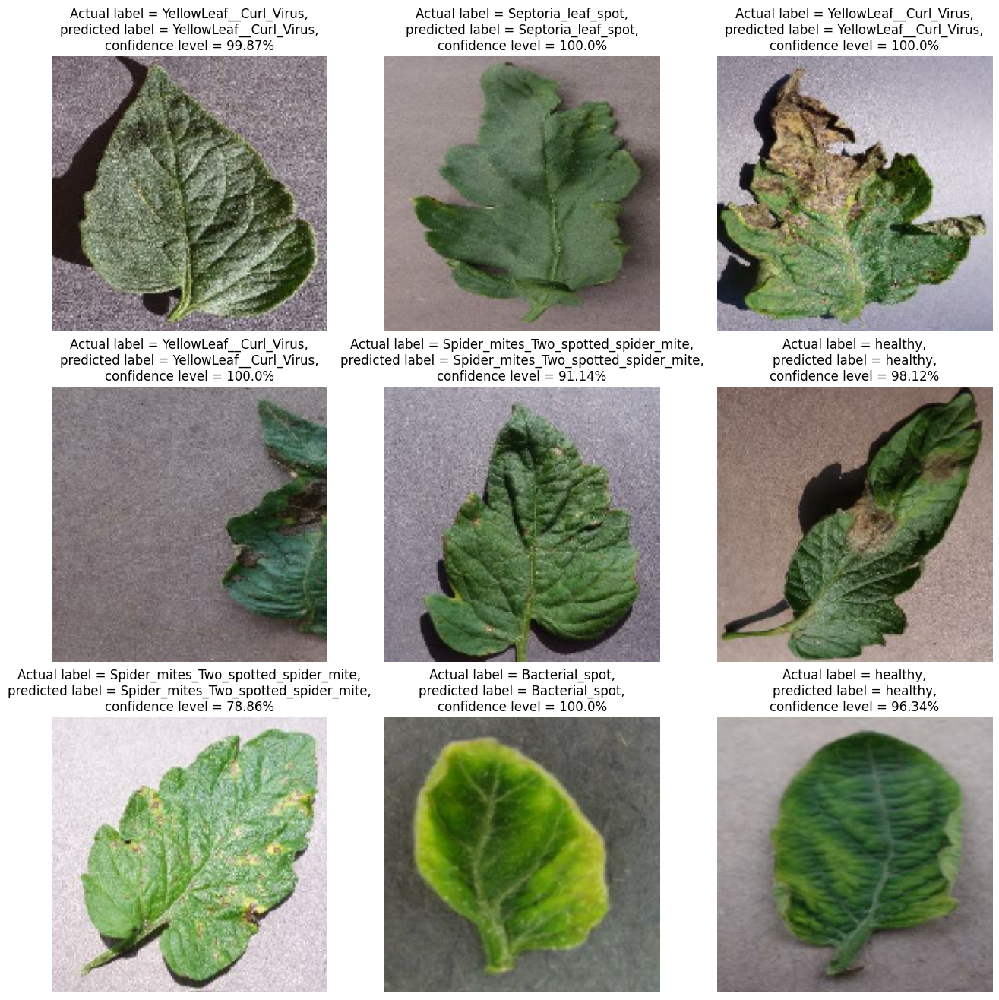

In [44]:
pipeline(base_model2, data_augmentation, preprocess_input2, freezes_layers_upto2, model_name2, train_ds, val_ds, test_ds, class_name,)

In [45]:
history4, model4 = open_saved_model('xception')

1/1 [==============================] - 1s 910ms/step


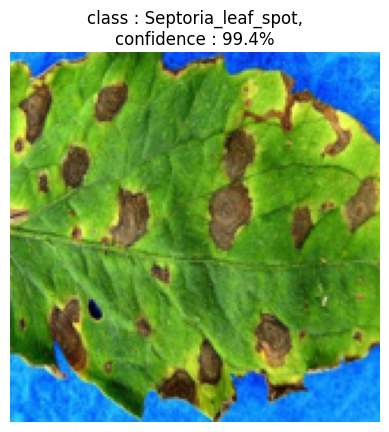

In [46]:
URL = 'https://th.bing.com/th/id/OIP.tugQknrVTSyPjgoln0aPSwHaEz?rs=1&pid=ImgDetMain'
file_name = Path.cwd() / 'saved_model' / 'class_name.npy'
class_name1 = np.load(file_name)
display_images(model4, class_name1, URL)